In [1]:
import os
import numpy as np
from tqdm import tqdm
from scipy.stats import norm
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False

In [72]:
colors = [
    "#92c5de",
    "#4393c3",
    "#d6604d",
    "#f4a582",
    "#b2182b",
    "#2166ac"
]

styles = [
    {"style": "--", "marker": "o"},
    {"style": "--", "marker": "s"},
    {"style": "--", "marker": "^"},
    {"style": "--", "marker": "v"},
    {"style": "--", "marker": "*"},
    {"style": "--", "marker": "D"},
]

def plot_statistics(stats_list, ground_truth, h_list, methods, name, style_list = styles, color_dic = colors, std2 = None):
    data_list = stats_list-ground_truth
    MSE_list = np.zeros((len(h_list), len(methods)))
    Biassq_list = np.zeros((len(h_list), len(methods)))
    Var_list = np.zeros((len(h_list), len(methods)))
    for index, h in enumerate(h_list): # stepsize
        data = data_list[index]
        for index2, estimator in enumerate(data): # methods
            MSE_list[index, index2] = np.mean((estimator) ** 2)
            Biassq_list[index, index2] = np.mean(estimator) ** 2
            Var_list[index, index2] = np.var(estimator)
                
    plt.figure(figsize=(18,4), dpi=300)
    plt.subplot(1,3,1)
    for index, stats in enumerate(MSE_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"], 
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    if std2:
        plt.axhline(y=std2, color='r', linestyle='--', label='Threshold')
        
    # ⭐ Clean scientific notation for x-axis
    from matplotlib.ticker import ScalarFormatter
    ax = plt.gca()
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(-3, 3))

    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('MSE', fontsize=16)
    # plt.title('MSE', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,2)
    for index, stats in enumerate(Biassq_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    if std2:
        plt.axhline(y=std2, color='r', linestyle='--', label='Threshold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    # ⭐ Clean scientific notation for x-axis
    from matplotlib.ticker import ScalarFormatter
    ax = plt.gca()
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(-3, 3))

    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel(r'Bias$^2$', fontsize=16)
    # plt.title(r'Bias$^2$', fontsize=16)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,3)
    for index, stats in enumerate(Var_list.T):
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('Var', fontsize=16)
    # plt.title('Var', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    # ⭐ Clean scientific notation for x-axis
    from matplotlib.ticker import ScalarFormatter
    ax = plt.gca()
    ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax.ticklabel_format(style='sci', axis='x', scilimits=(-3, 3))

    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    # plt.rcParams['text.usetex'] = True
    plt.suptitle(name, y=1., fontsize=18)
    plt.show()
    return

### new statistics

In [94]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
filestart = ['Unperturbed', 'Irr-S', 'Irr-M', 'Irr-L', 'Irr-SO', 'Irr-O']
h_list = [0.0001, 0.00025, 0.0005, 0.00075, 0.001, 0.00125, 0.0015, 0.00175, 0.002]
T = 2000
K = 100000
path = f'Aug_04_fixbudget/'
for i, h in enumerate(h_list):
    data_ = []
    for j, method in enumerate(methods):
        filename = f'{filestart[j]}/stats_dt{h}_T{T}_K{K}.npy'
        data_i = np.array(np.load(os.path.join(path, filename), allow_pickle=True))
        # zipped = data_i.item() if isinstance(data_i, np.ndarray) and data_i.shape == () else data_i[()]
        data_.append(data_i)
    data.append(data_)
data = np.array(data)
data = np.transpose(data, axes=(0, 1, 3, 2, 4))
print(data.shape)
print(data[0].shape)
stats = np.load('stats_list.npy', allow_pickle=True).item()
stats_mean = stats['stats_mean']
stats_std = stats['stats_std']
statistics_name = ['|X[4]|',r'$X[4]^2$', 'P(X[4]>0)', 'P(X[4]>1)', 'P(X[4]>2)', 'P(X[4]>3)', 'P(X[4]>4)', 'P(X[0,1]>0)', 'P(X[3,4]>0)', 'sum(X)', 'X[1]*X[4]']

(9, 6, 128, 10, 11)
(6, 128, 10, 11)


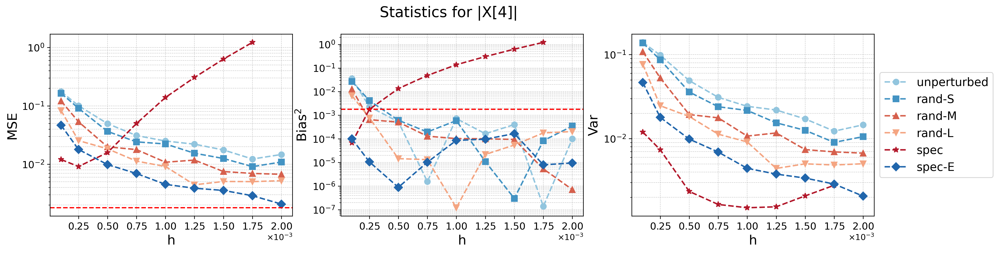

In [74]:
idx = 0
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
stats_list[stats_list > 2*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

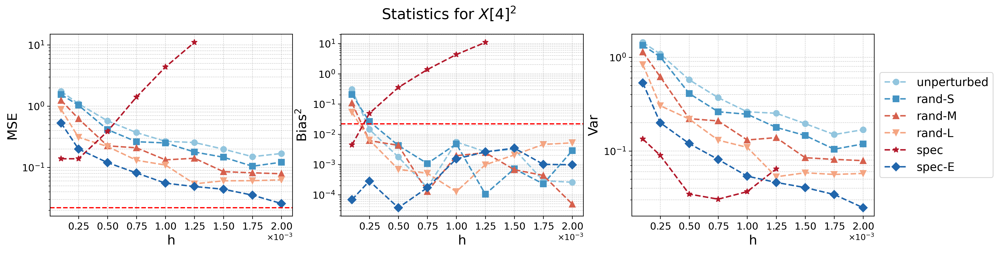

In [95]:
idx = 1
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
stats_list[stats_list > 3*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

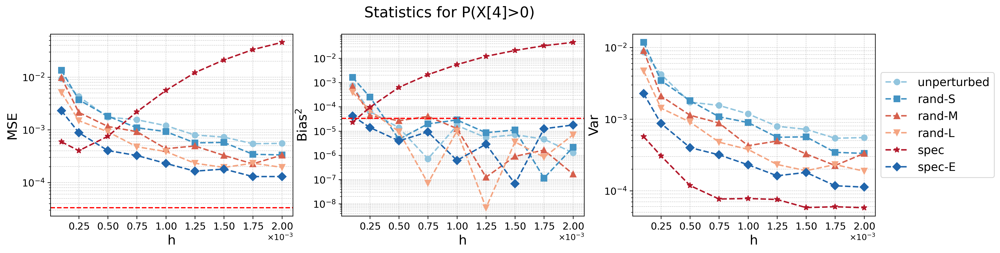

In [76]:
idx = 2
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 2*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

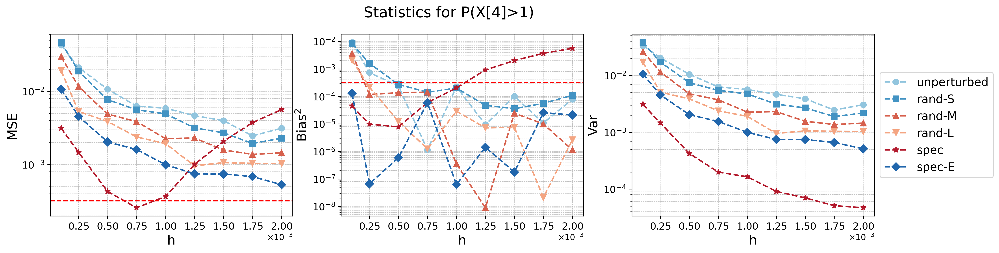

In [77]:
idx = 3
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 2*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

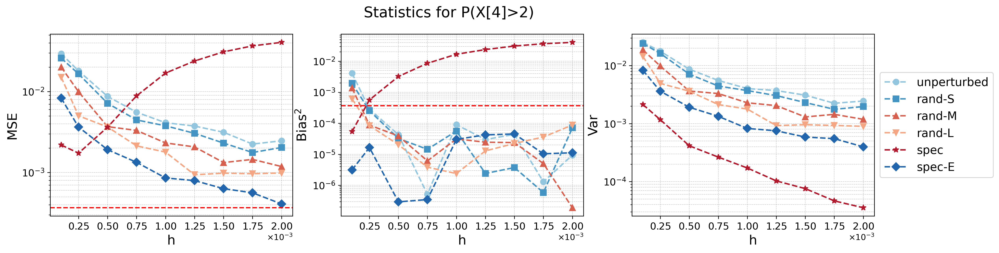

In [96]:
idx = 4
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 3*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

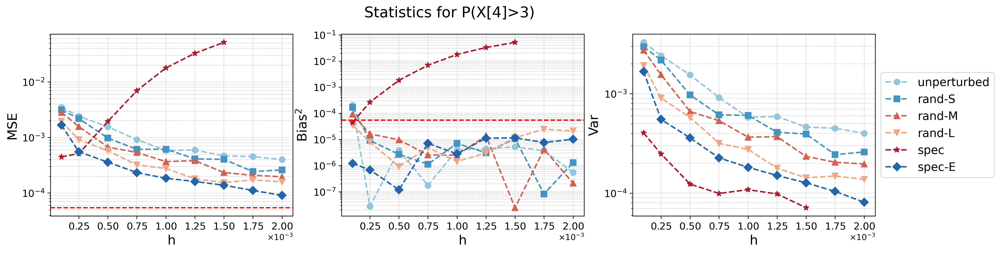

In [97]:
idx = 5
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
stats_list[stats_list > 7*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

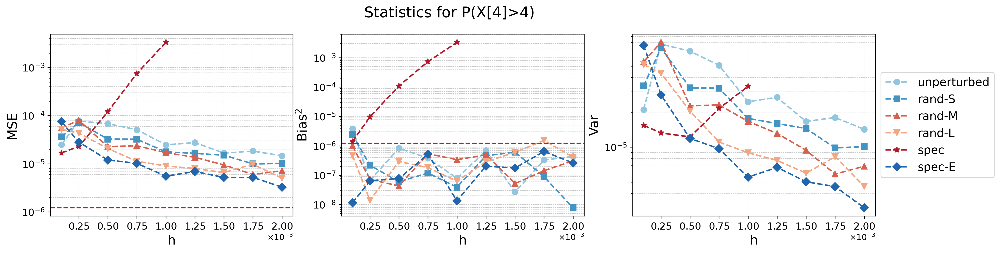

In [98]:
idx = 6
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
stats_list[stats_list > 30*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

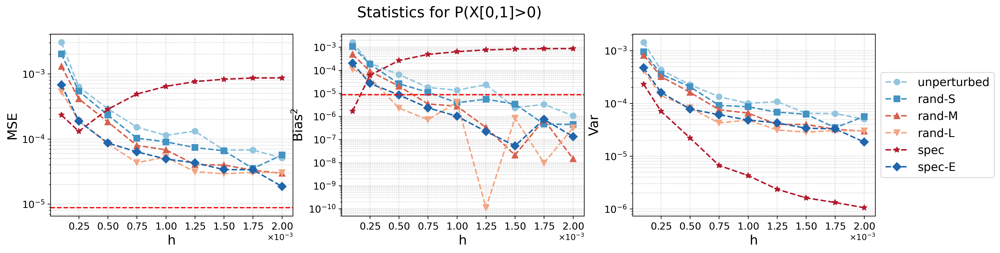

In [81]:
idx = 7
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 20*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

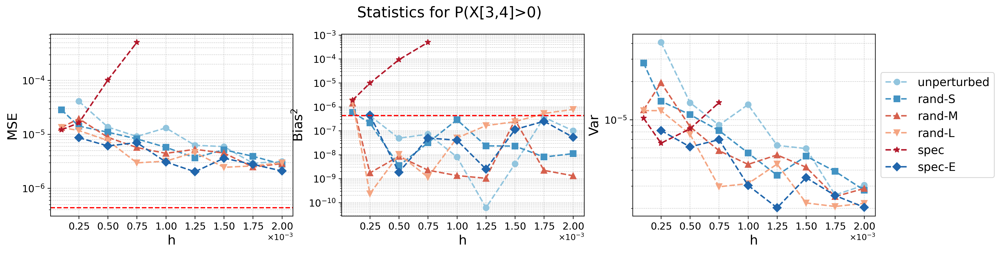

In [82]:
idx = 8
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 20*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

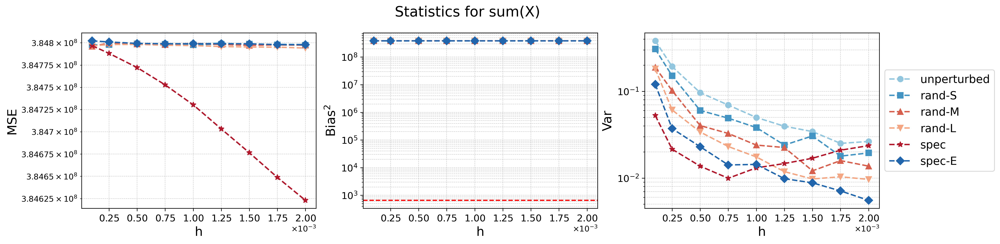

In [49]:
idx = 9
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
# stats_list[stats_list > 20*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

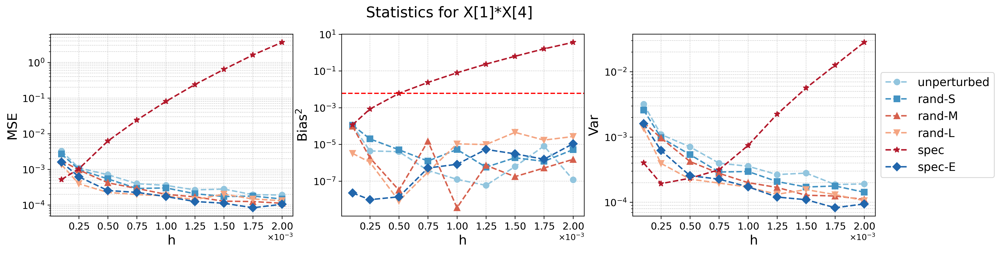

In [51]:
idx = 10
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
# stats_list[stats_list > 100*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx])

# fix time

In [45]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['Unperturbed', 'Irr-S', 'Irr-M', 'Irr-L', 'Irr-SO', 'Irr-O']
filestart = ['unperturbed', 'irr-s', 'irr-m', 'irr-l', 'irr-so', 'irr-o']
h_list = [0.0001, 0.00025, 0.0005, 0.00075, 0.001, 0.00125, 0.0015, 0.00175, 0.002]
T = 2000
K = 100000
path = f'Jul_01_fixbudget/'
for i, h in enumerate(h_list):
    data_ = []
    for j, method in enumerate(methods):
        filename = f'{method}/stats_dt{h}_T{T}_K{K}.npy'
        data_i = np.array(np.load(os.path.join(path, filename), allow_pickle=True))
        # zipped = data_i.item() if isinstance(data_i, np.ndarray) and data_i.shape == () else data_i[()]
        data_.append(data_i)
    data.append(data_)
data = np.array(data)
data = np.transpose(data, axes=(0, 1, 3, 2, 4))
print(data.shape)
print(data[0].shape)

(9, 6, 128, 10, 8)
(6, 128, 10, 8)


In [83]:
# load 8 statistics from storage, nonadaptive
data = []
methods = ['Unperturbed', 'Irr-S', 'Irr-M', 'Irr-L', 'Irr-SO', 'Irr-O']
h_list = [0.0001, 0.00025, 0.0005, 0.00075, 0.001, 0.00125, 0.0015, 0.00175, 0.002]
T = 100
K = 100000
path = f'Aug_04_fixlength/'
for i, h in enumerate(h_list):
    data_ = []
    for j, method in enumerate(methods):
        K = int(T/h)
        filename = f'{method}/stats_dt{h}_T{T}_K{K}.npy'
        data_i = np.array(np.load(os.path.join(path, filename), allow_pickle=True))
        # zipped = data_i.item() if isinstance(data_i, np.ndarray) and data_i.shape == () else data_i[()]
        data_.append(data_i)
    data.append(data_)
data = np.array(data)
data = np.transpose(data, axes=(0, 1, 3, 2, 4))
print(data.shape)
print(data[0].shape)  # (11 step sizes, 6 methods, 128 repeated chains, 10 subchains, 8 statistics)
statistics_name = ['|X[4]|',r'$X[4]^2$', 'P(X[4]>0)', 'P(X[4]>1)', 'P(X[4]>2)', 'P(X[4]>3)', 'P(X[4]>4)', 'P(X[0,1]>0)', 'P(X[3,4]>0)', 'sum(X)', 'X[1]*X[4]']
MH_stats = np.load('stats_list.npy', allow_pickle=True).item()
stats_mean = MH_stats['stats_mean']
stats_std = MH_stats['stats_std']

(9, 6, 128, 10, 11)
(6, 128, 10, 11)


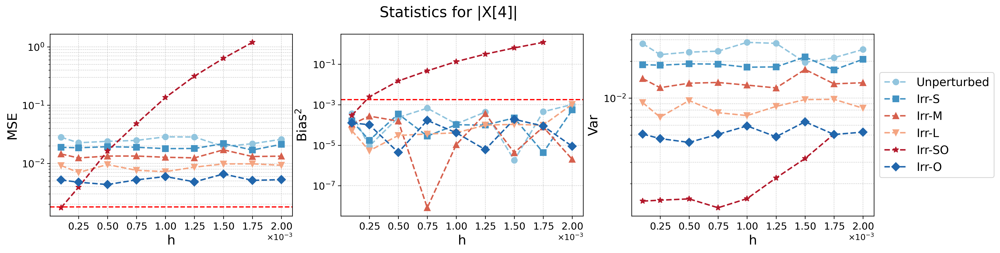

In [84]:
idx = 0
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3).copy()
stats_list[stats_list > 2*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

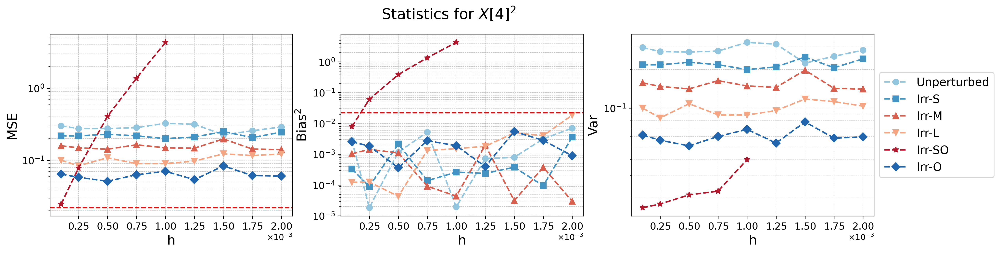

In [85]:
idx = 1
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 2*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

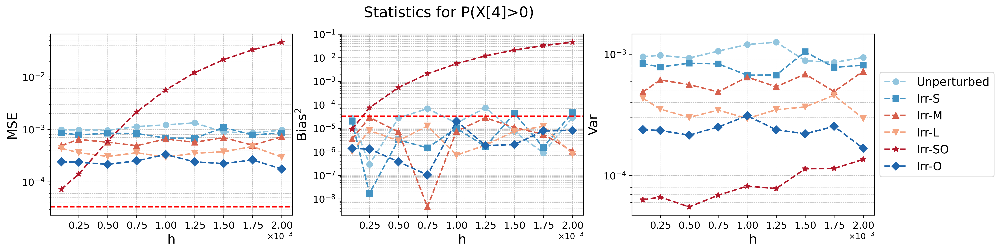

In [86]:
idx = 2
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

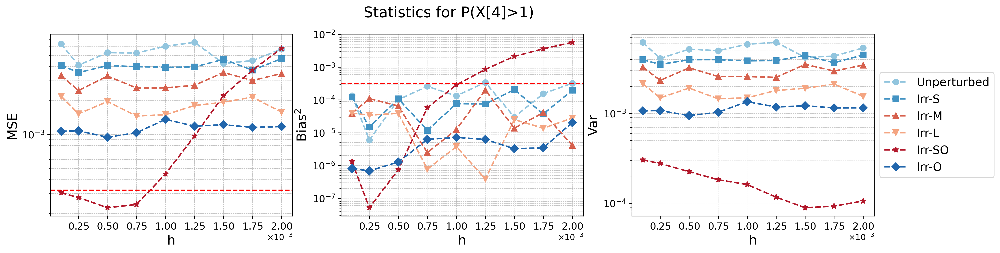

In [88]:
idx = 3
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

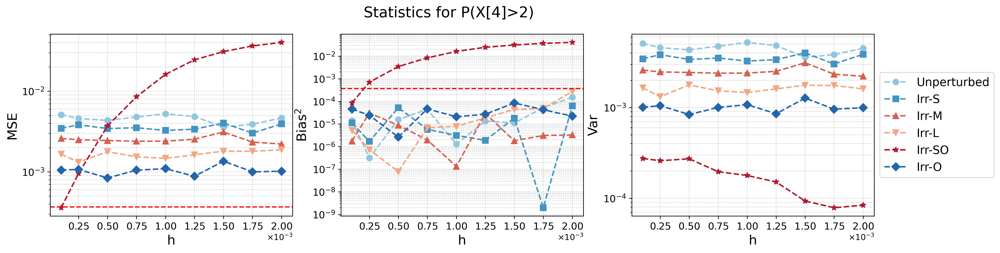

In [87]:
idx = 4
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

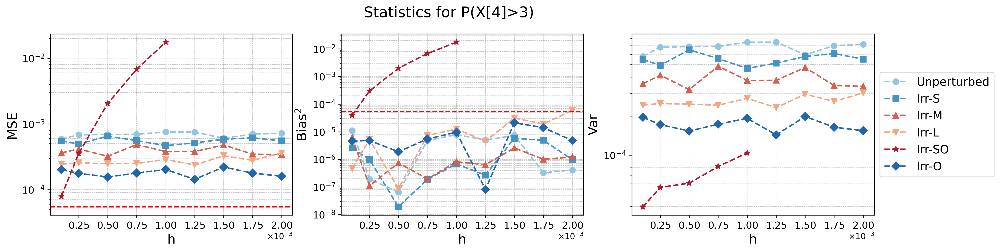

In [89]:
idx = 5
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 5*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

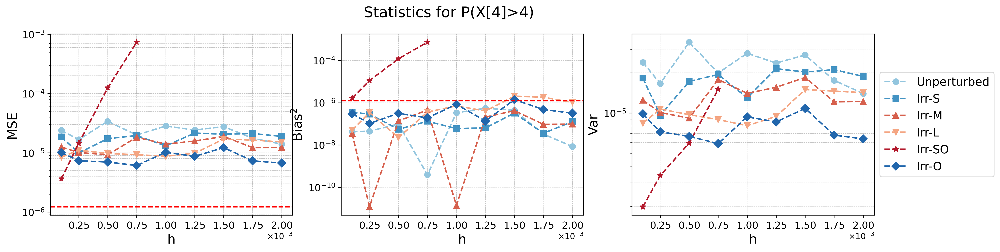

In [90]:
idx = 6
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 20*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

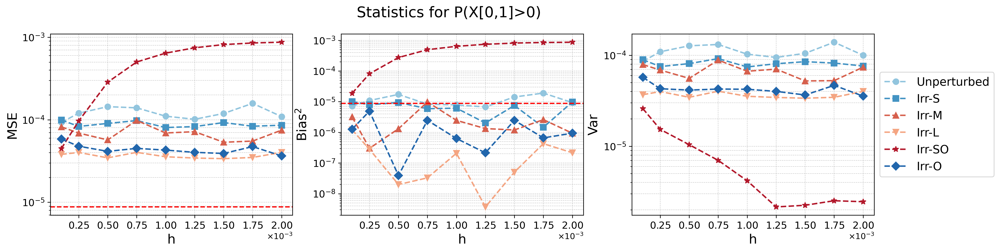

In [91]:
idx = 7
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, name, std2 = stats_std[idx]**2)

In [28]:
statistics_name = ['L1 norm','L2 squared norm', 'max(|X|)', 'max(X)', 'P(X[0,1]>0)', 'P(X[3,4]>0)', 'sum(X)', 'exp(|X|/2)']

In [51]:
stats = np.load('stats_list.npy', allow_pickle=True).item()
stats_mean = stats['stats_mean']
stats_std = stats['stats_std']

In [52]:
stats_mean

array([ 1.28558279e+01,  1.45640248e+01,  2.02164808e+00,  1.69878852e+00,
        1.04166667e-06,  6.18973125e-01, -1.63482753e+00,  1.05934913e+03])

In [53]:
stats_std

array([6.53989932e-02, 1.85899238e-01, 2.20772206e-02, 3.15359908e-02,
       4.54051973e-06, 1.25319342e-02, 5.46297668e-02, 3.98580106e+01])

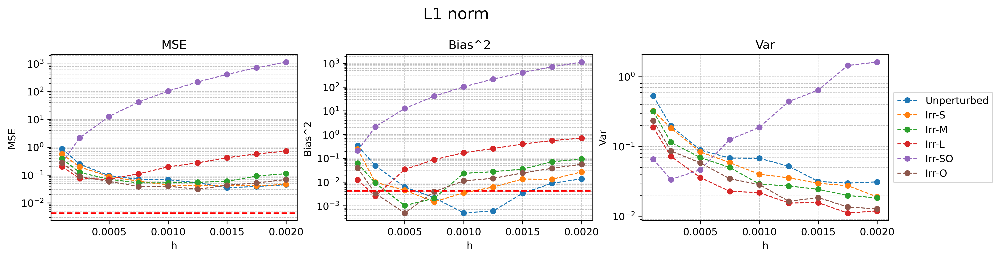

In [54]:
idx = 0
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

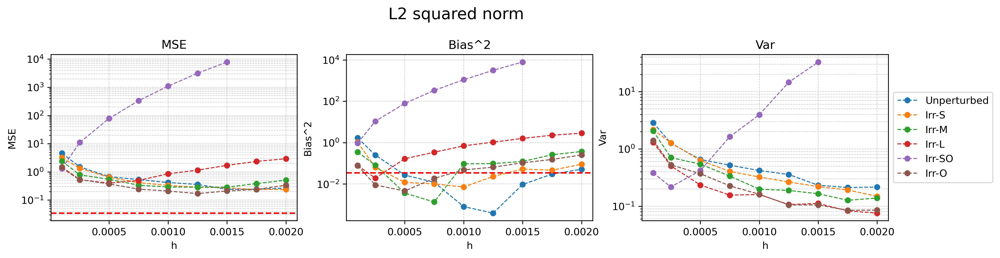

In [55]:
idx = 1
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

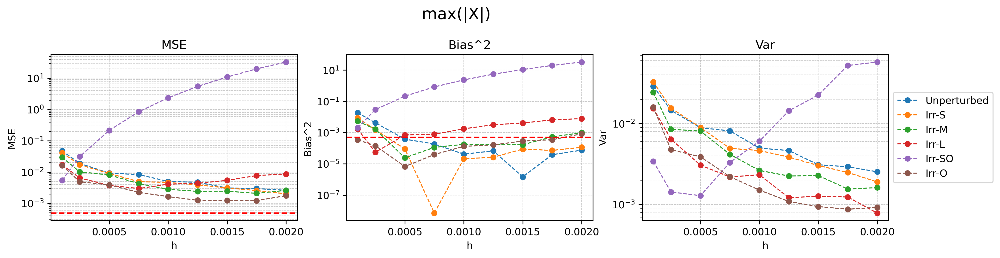

In [56]:
idx = 2
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

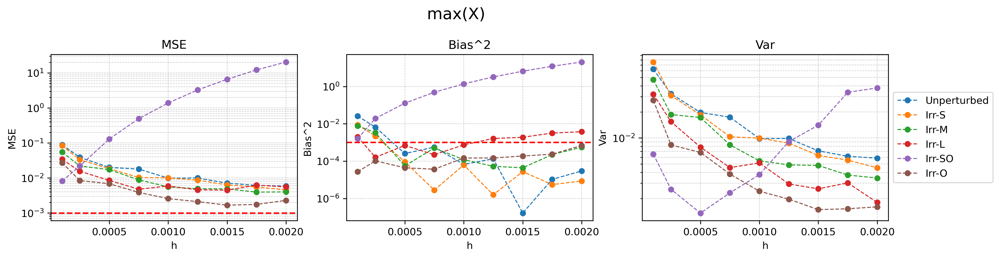

In [57]:
idx = 3
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

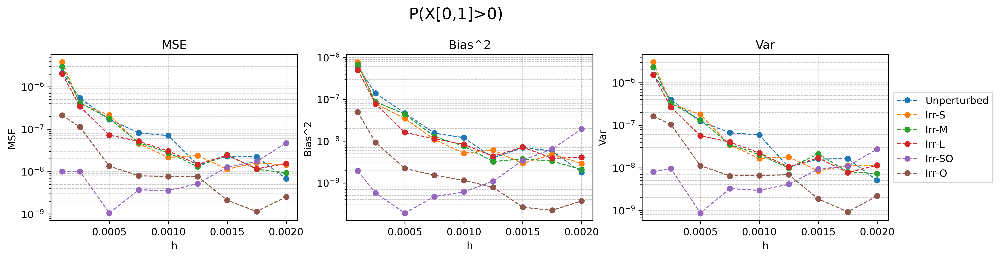

In [58]:
idx = 4
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
# stats_list[stats_list > 100*stats_mean[idx]] = np.nan
plot_statistics(stats_list, 0, h_list, methods, statistics_name[idx])

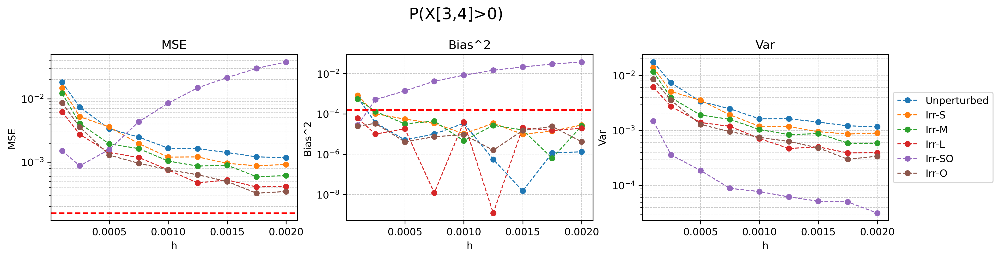

In [59]:
idx = 5
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
# stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

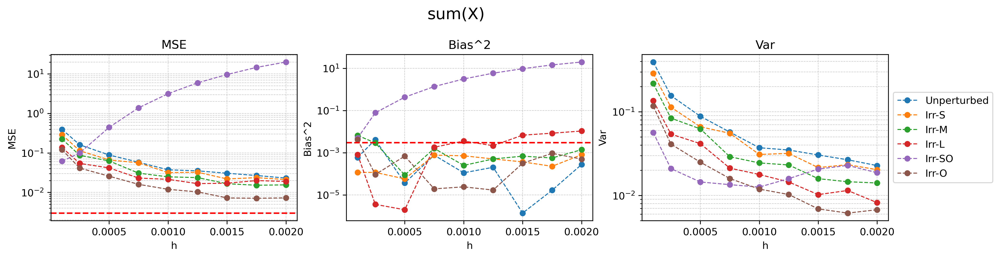

In [60]:
idx = 6
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
# stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])

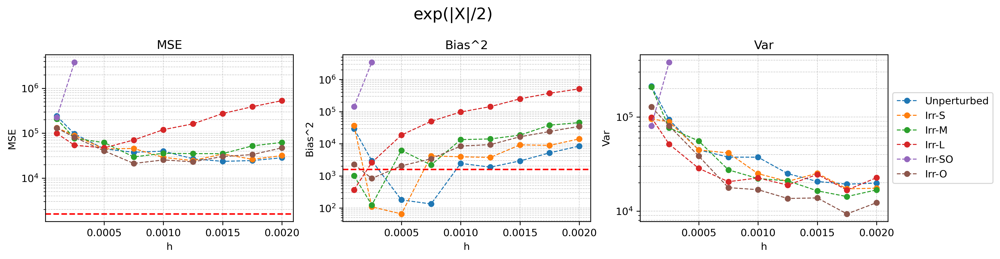

In [61]:
idx = 7
name = r'Statistics for '+statistics_name[idx]
stats_list = np.mean(data[:,:,:,:,idx], axis=3)
stats_list[stats_list > 10*stats_mean[idx]] = np.nan
plot_statistics(stats_list, stats_mean[idx], h_list, methods, statistics_name[idx], stats_std[idx])